In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn.cluster import AgglomerativeClustering,Birch, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from tqdm import tqdm

0hr  Skewness: 0.04316209884796835
9.5hr  Skewness: -1.6723128939209213
11.5hr  Skewness: 1.0411750956906514
13.5hr  Skewness: 0.4598085890274028
15.5hr  Skewness: -0.24711966751119882
18.5hr  Skewness: 0.17008252800883317
20.5hr  Skewness: 0.353671541365756


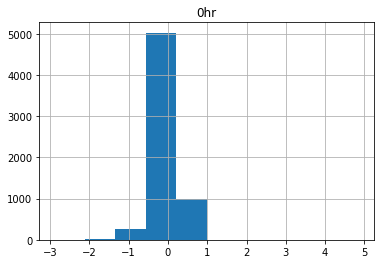

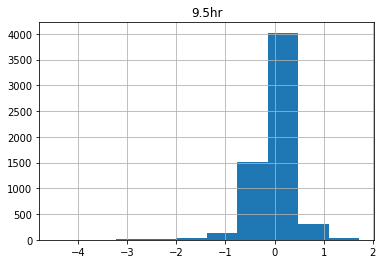

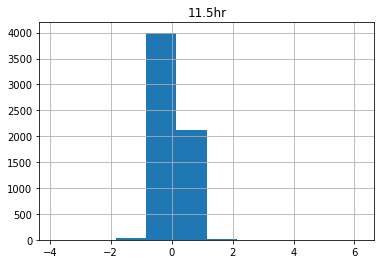

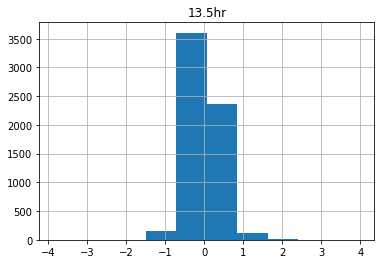

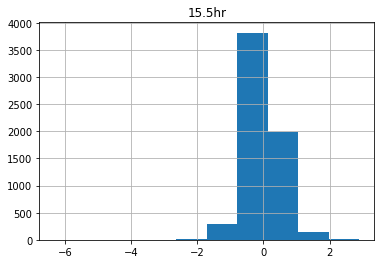

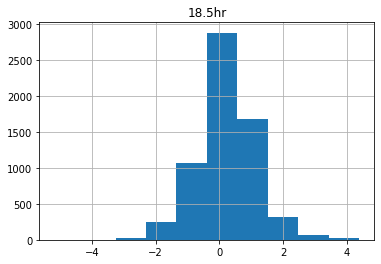

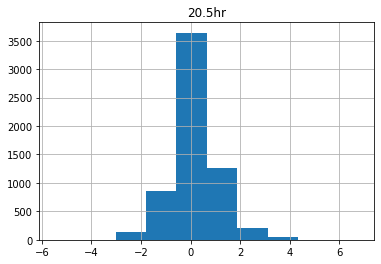

In [2]:
df = pd.read_csv('yeast.tsv',sep='\t')
df = df.iloc[: , 1:]

dim = df.columns.values.tolist()
for d in dim:
    df.hist(column=d)
    print(d, ' Skewness:', df[d].skew())

In [3]:
def _load_dataset():

    df = pd.read_csv('yeast.tsv',sep='\t')
    df = df.iloc[: , 1:]

    return _fill_missing_values(df)

def _fill_missing_values(df):

    for (columnName, _) in df.iteritems():
        df[columnName] = df[columnName].fillna(df[columnName].median())

    return df

dataset = _load_dataset()
print(dataset, dataset.shape)

dataset = StandardScaler().fit_transform(dataset)
print(dataset)

        0hr  9.5hr  11.5hr  13.5hr  15.5hr  18.5hr  20.5hr
0     0.165  0.272   0.046   0.429   0.143  -0.211   0.183
1     0.101  0.237  -0.109   0.149   0.111  -0.140   0.252
2     0.150  0.469  -0.015   0.144   0.072   0.115   0.215
3    -1.193  0.027  -0.963  -0.510  -2.392   0.216  -0.939
4    -0.741  0.227  -0.986  -0.048  -1.277  -0.194   0.185
...     ...    ...     ...     ...     ...     ...     ...
6395 -0.001  0.228   0.018  -0.007   1.748   1.283  -0.941
6396 -0.001  0.027   0.018  -0.007   0.800   0.216  -0.705
6397  0.132  0.090  -0.217  -0.117   0.250  -0.021   0.185
6398  0.231  0.218   0.044   0.028   0.252  -0.357   0.185
6399 -0.036  0.241  -0.202  -0.007   0.400  -0.500   0.185

[6400 rows x 7 columns] (6400, 7)
[[ 0.63760455  0.73126576  0.02859003 ...  0.3255564  -0.47716499
  -0.01184573]
 [ 0.43019057  0.636602   -0.40362842 ...  0.26300297 -0.39862836
   0.06463642]
 [ 0.5889919   1.26408753 -0.14150885 ...  0.18676597 -0.11656018
   0.02362425]
 ...
 [ 0.5306

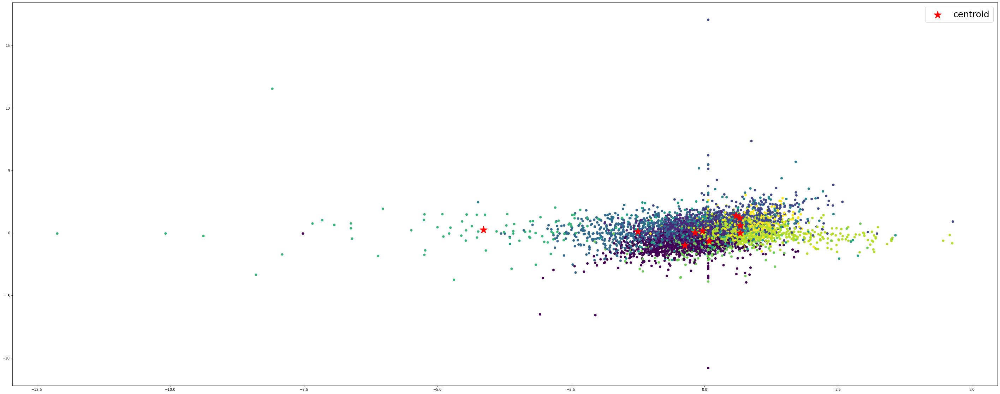

In [6]:
# this is for testing purpose, this is from sklearn
km = KMeans(n_clusters=10, random_state=0).fit(dataset)
km.labels_
plt.scatter(dataset[:,1], dataset[:,2], c=km.labels_)
plt.scatter(km.cluster_centers_[:, 1], km.cluster_centers_[:, 2], marker='*', s=500, c='red', label='centroid')
plt.rcParams["figure.figsize"] = (50,20)
plt.legend(fontsize=25)
plt.show()


In [4]:
#this is my program for kmeans

def _initialize_centroids_(data, k):
    num_example, _ = data.shape
    rand_idx = np.random.choice(num_example, k, replace=False)
    centroids = data[rand_idx, :]

    return centroids

def _assign_points_(data, centroids):
    distance_arr = []

    for point in data:
        centr = np.array(centroids)
        distance = np.sqrt(np.sum((point - centr)**2, axis=1))                     #this will get the array of distances between one point to each of the k centers
        distance_arr.append(distance)
   
    points = np.array([np.argmin(i) for i in distance_arr])

    return points

def _update_centroids_(data, k, points):
    _, features = data.shape
    centroids = np.zeros((k, features))

    for indx in range(k):
        datapoints = data[points == indx]
        new_centroid = np.mean(datapoints, axis=0)
        centroids[indx] = new_centroid
    
    return centroids

def predict(points):

    return points

def _is_converged(centroid, updatedCentroids):

    centroid = np.array(centroid)
    updatedCentroids = np.array(updatedCentroids)

    list_of_diff = centroid - updatedCentroids

    return not list_of_diff.any()

def wss(data, k):
    wss_arr = []
    for i in tqdm(range(1, k+1)):
        # print(i)
        sum = 0
        centroid, predict = _k_means_(data, i)
        
        for j in range(len(data)):
            
            center = centroid[int(predict[j])]
            sum += (data[j, 0] - center[0])**2 + (data[j, 1] - center[1])**2 + (data[j, 2] - center[2])**2 + (data[j, 3] - center[3])**2  + (data[j, 4] - center[4])**2 + (data[j, 5] - center[5])**2 + (data[j, 6] - center[6])**2 

        wss_arr.append(sum)
    
    return wss_arr


def _k_means_(data, k, max_itr=300):
    centroids = _initialize_centroids_(data, k)
    points = _assign_points_(data, centroids)

    for _ in range(max_itr):
        centroids = _update_centroids_(data, k, points)
        points = _assign_points_(data, centroids)
        temp = centroids
        converge = _is_converged(temp, centroids)

        if(converge):
            break

    return centroids, predict(points)


   

In [46]:
list = wss(dataset, 700)

 25%|██▍       | 172/700 [01:17<03:45,  2.35it/s]/Users/zacyou/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/zacyou/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:153: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
100%|██████████| 700/700 [1:23:49<00:00,  7.18s/it]  


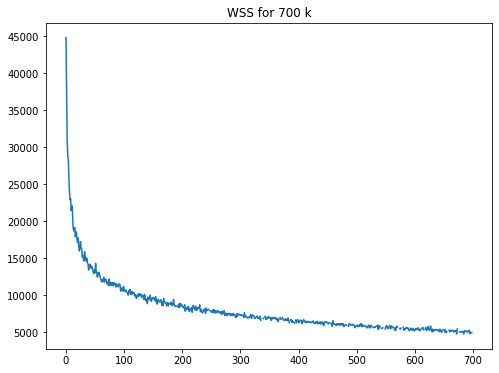

In [61]:
plt.figure()
plt.plot(range(700), list)
plt.title('WSS for 700 k')
# plt.rcParams["figure.figsize"] = (8, 6)
plt.show()

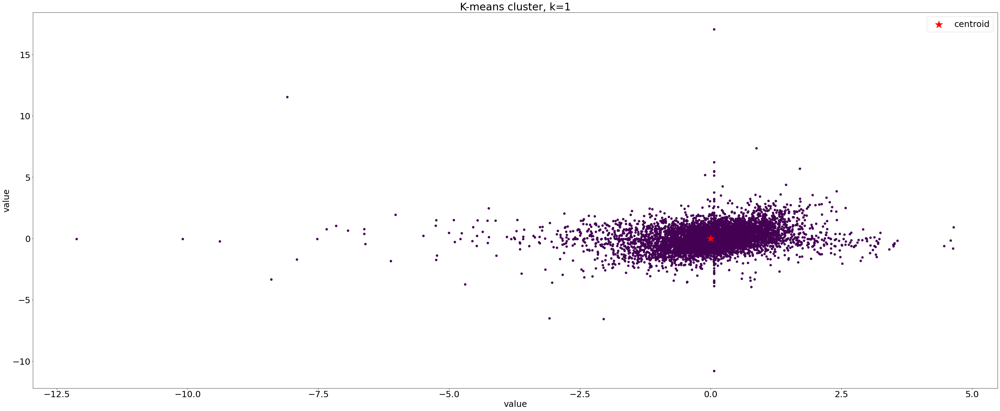

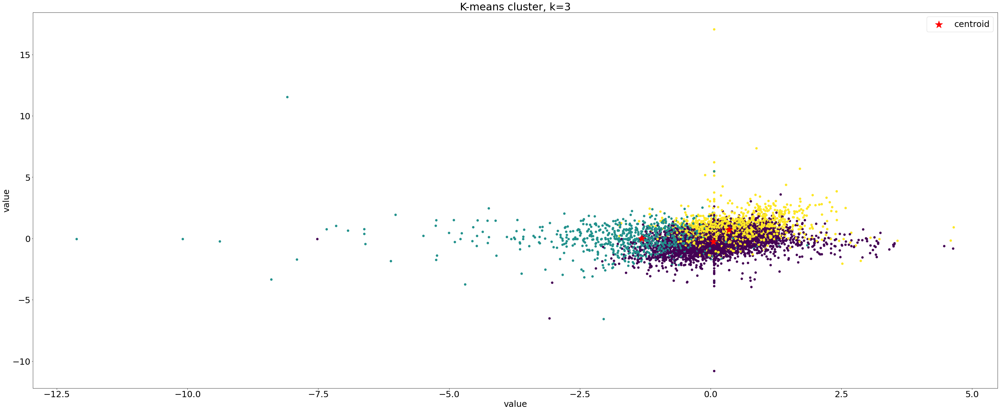

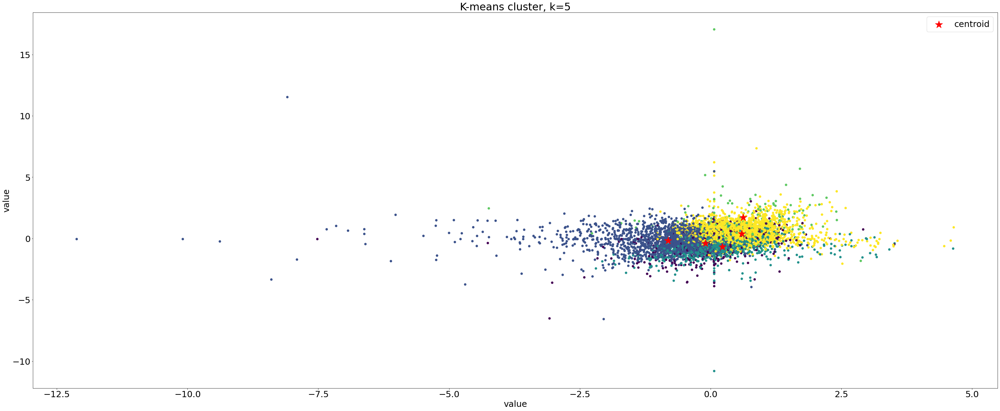

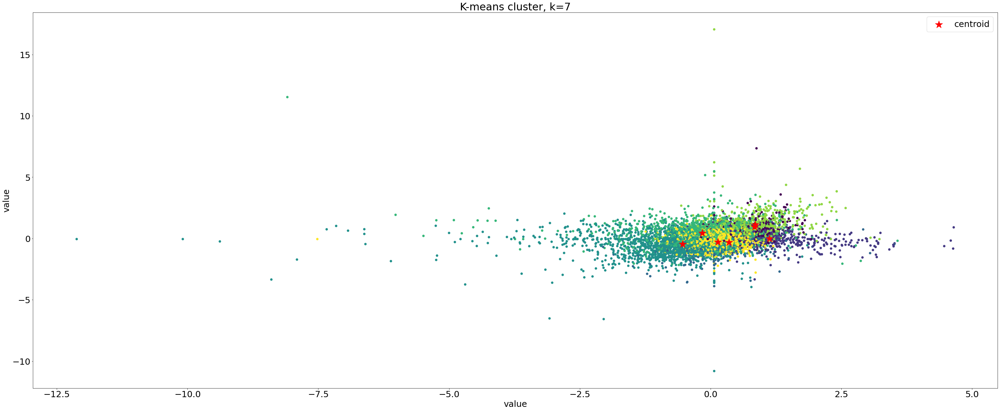

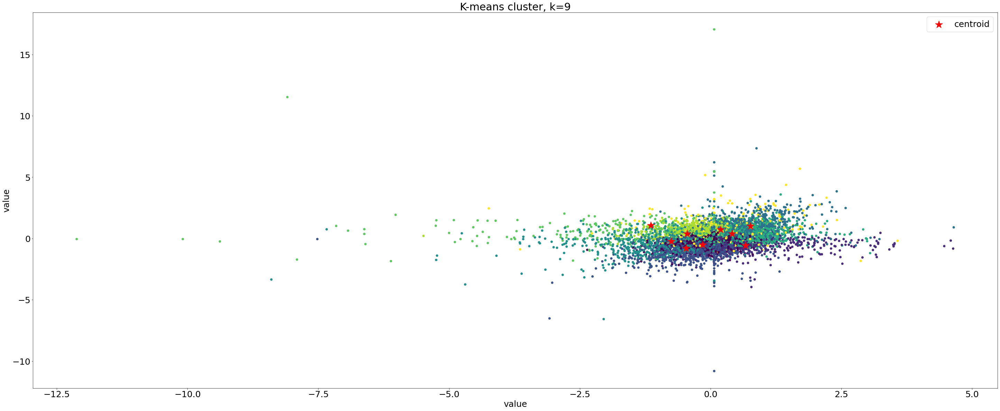

...

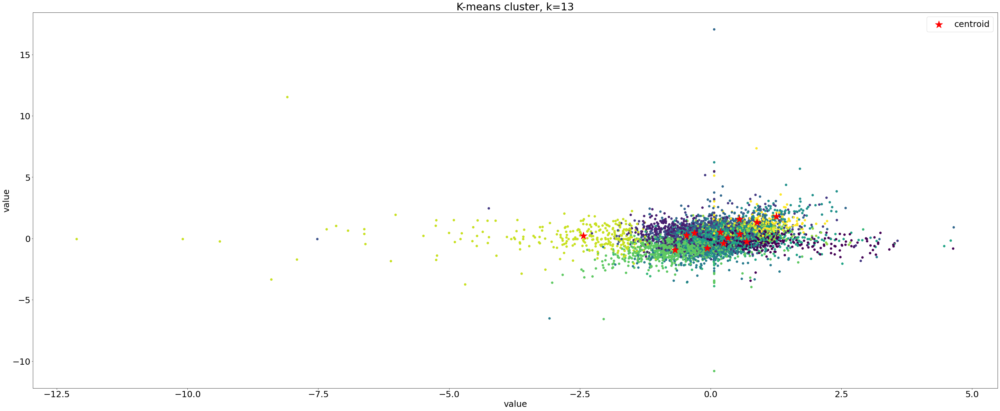

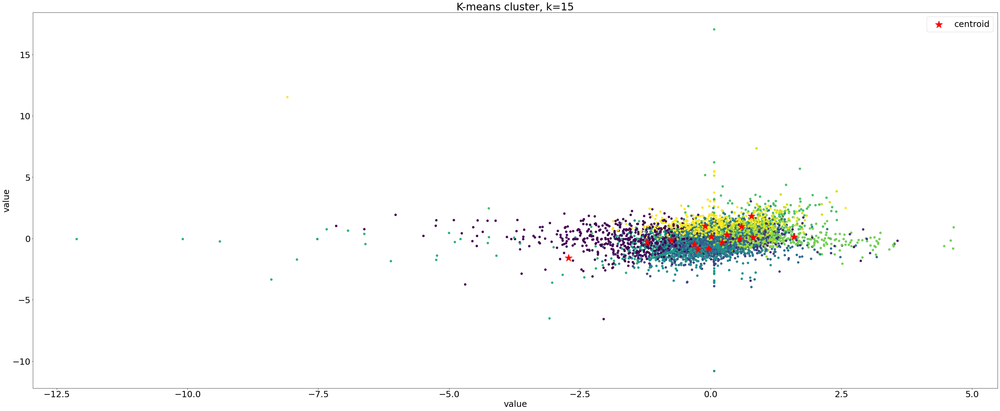

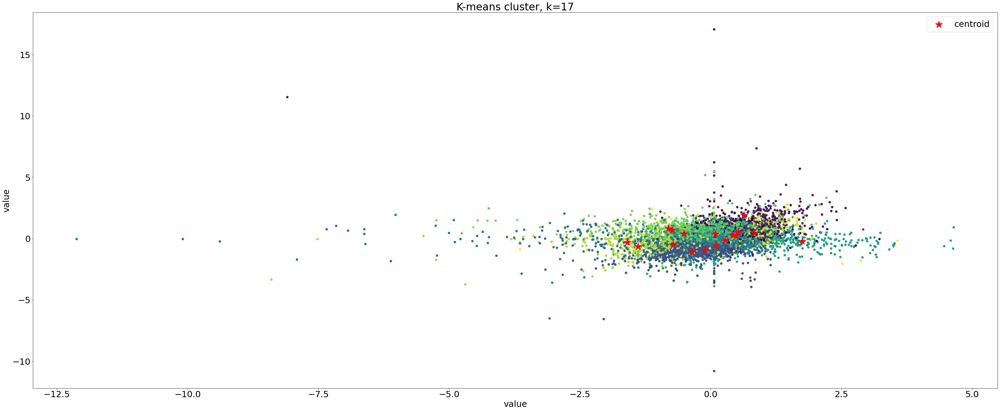

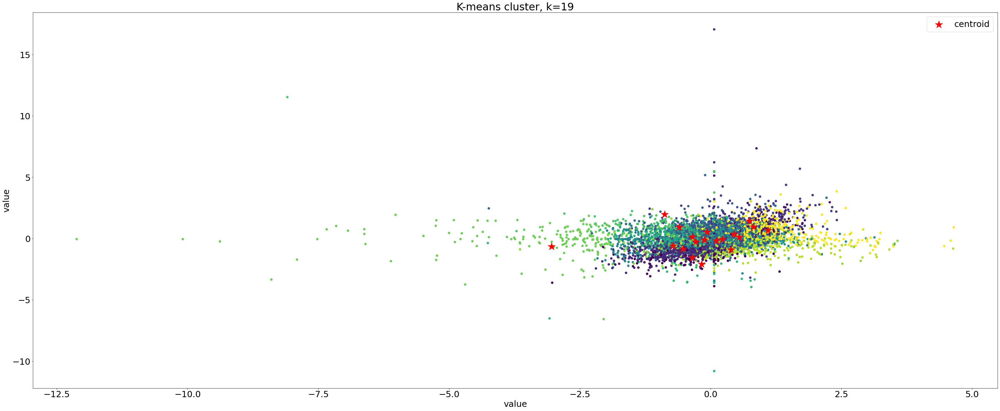

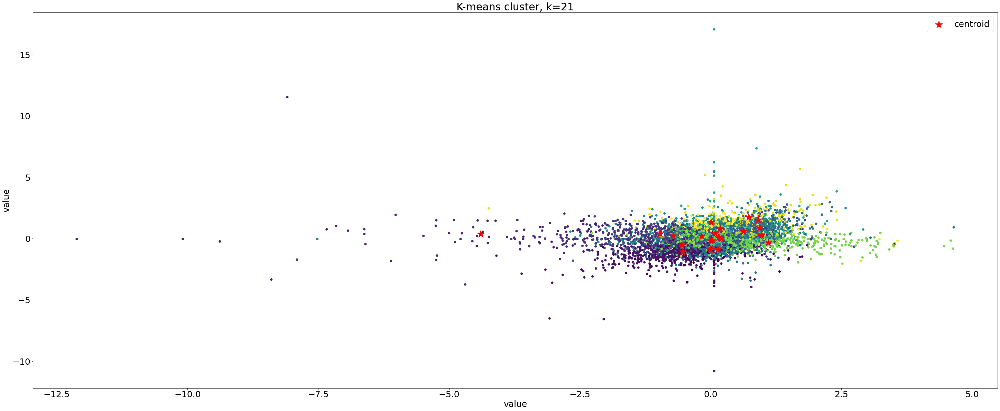

In [27]:
for k in range(1, 23, 2):
    centroids, y_pred = _k_means_(dataset, k, 100)
    plt.figure()
    plt.scatter(dataset[:,1], dataset[:,2], c=y_pred)
    plt.title('K-means cluster, k=' + str(k), fontsize=30)
    plt.xlabel('value', fontsize=25)
    plt.ylabel('value', fontsize=25)
    plt.tick_params(axis='both', which='major', labelsize=25)
    plt.scatter(centroids[:, 1], centroids[:, 2], marker='*', s=500, c='red', label='centroid')
    plt.rcParams["figure.figsize"] = (50,20)
    plt.legend(fontsize=25)
    plt.show()

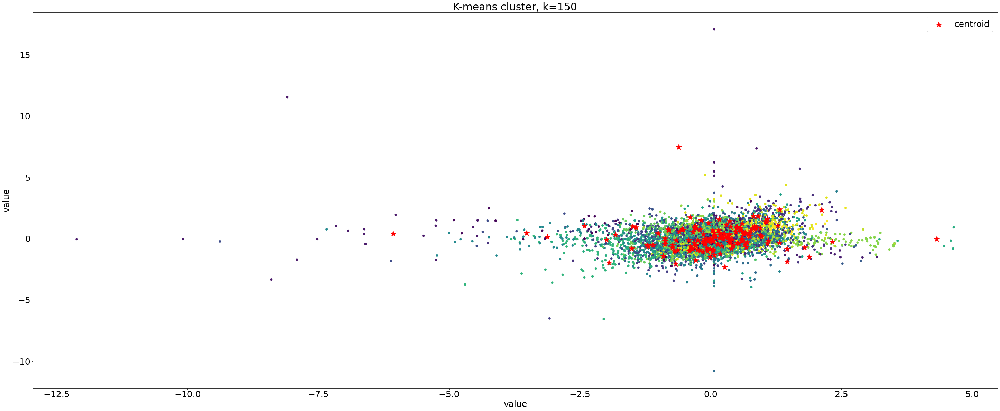

In [73]:
c, y_pred = _k_means_(dataset, 150)
plt.rcParams["figure.figsize"] = (50,20)
plt.title('K-means cluster, k=' + str(150), fontsize=30)
plt.xlabel('value', fontsize=25)
plt.ylabel('value', fontsize=25)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.scatter(dataset[:,1], dataset[:,2], c=y_pred)
plt.scatter(c[:, 1], c[:, 2], marker='*', s=300, c='red', label='centroid')
plt.legend(fontsize=25)

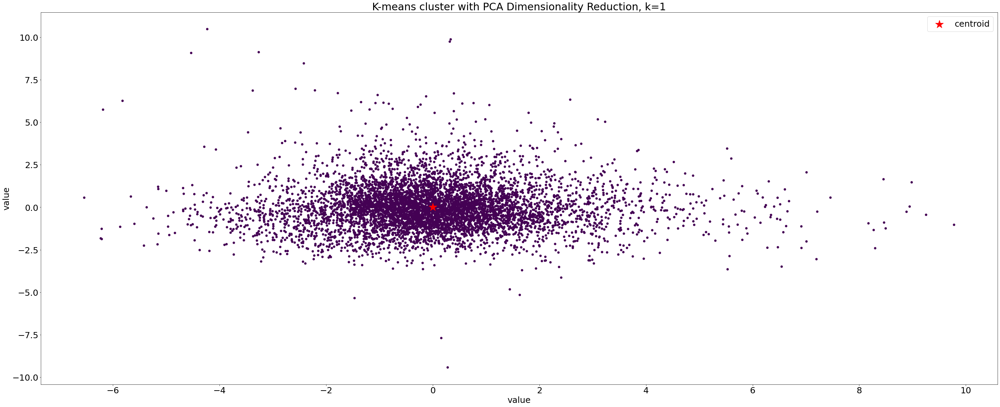

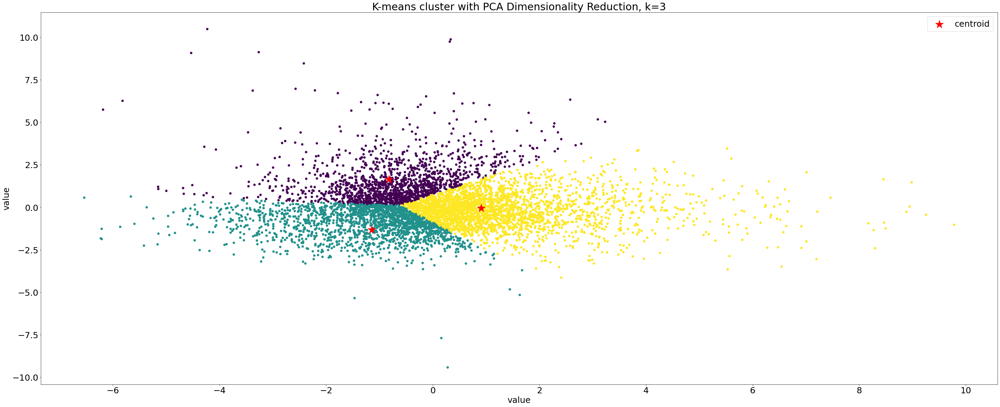

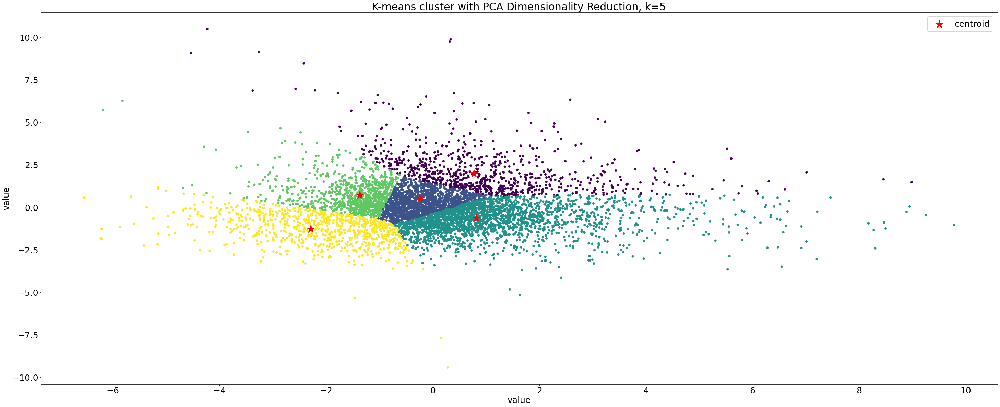

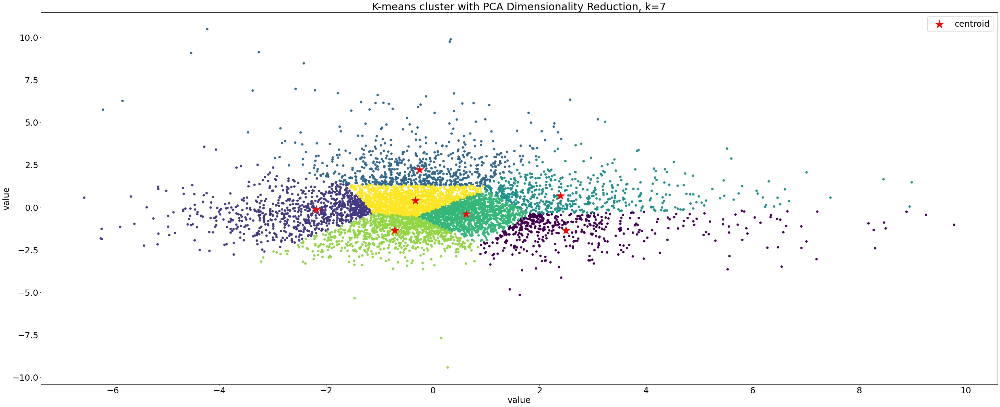

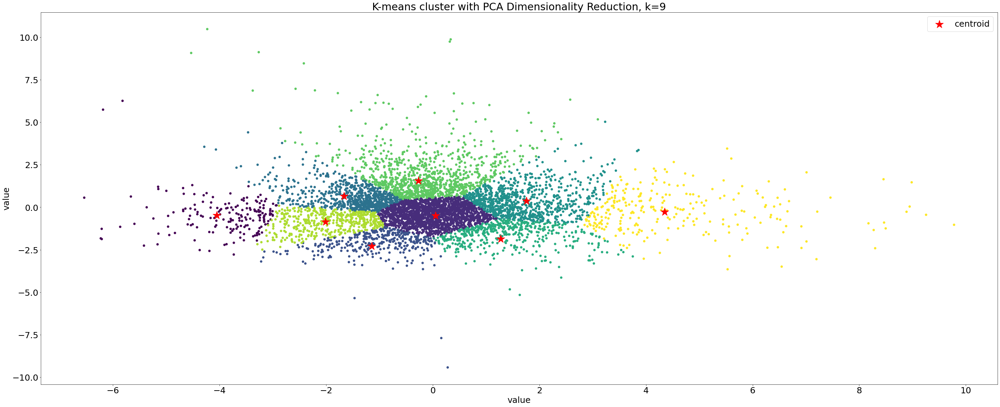

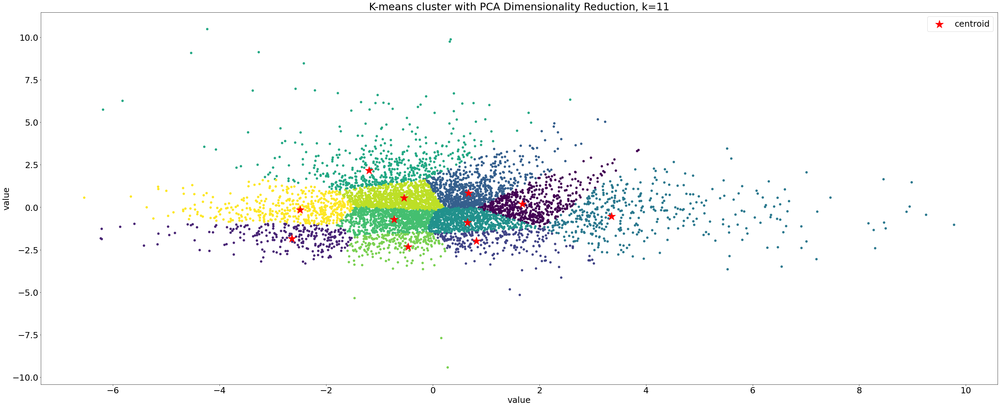

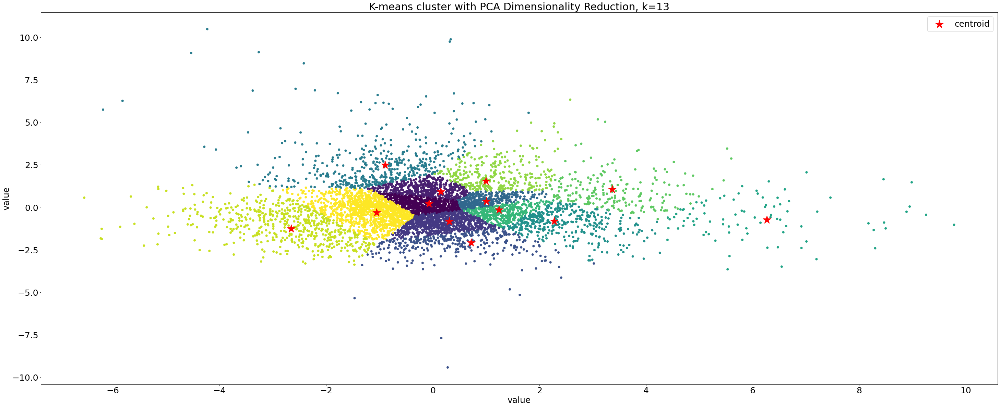

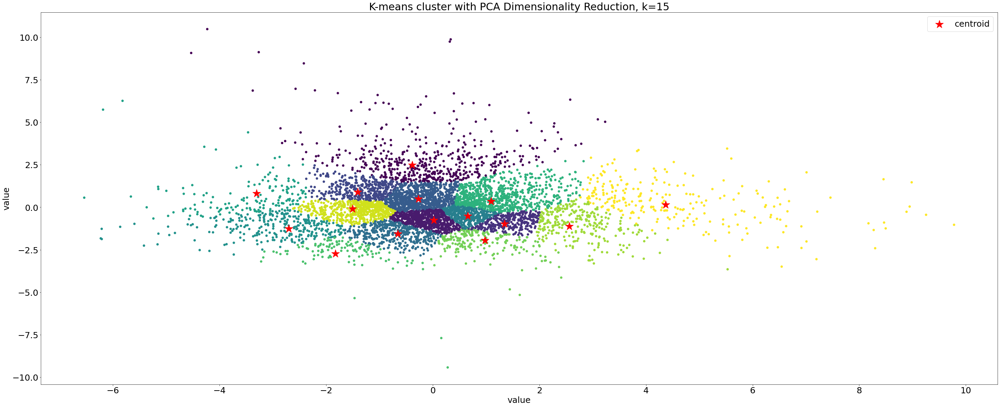

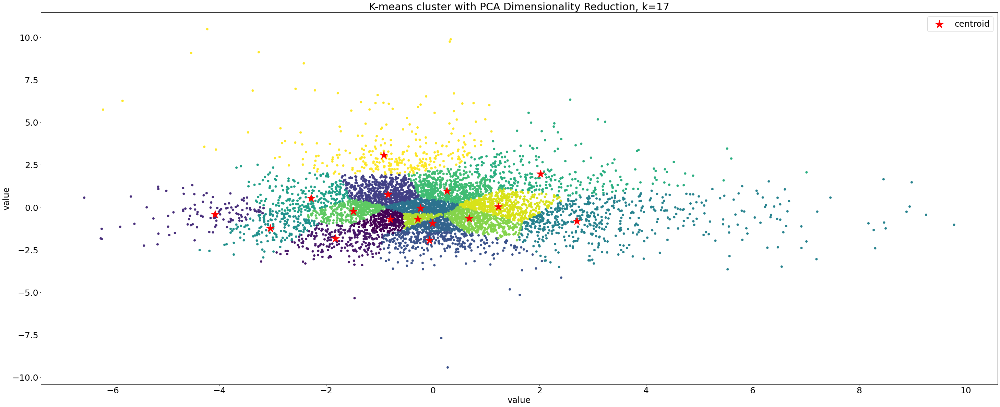

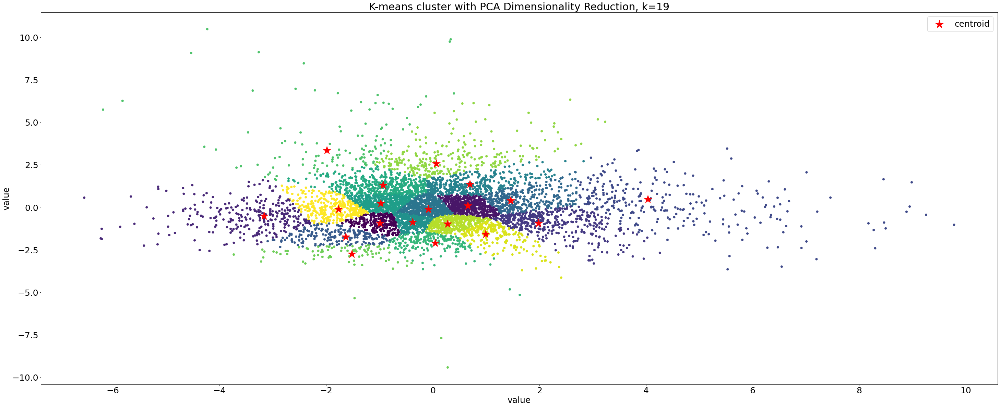

In [35]:
data_reduced = PCA(n_components=2).fit_transform(dataset)
reduced_components = pd.DataFrame(data_reduced)


for k in range(1, 21, 2):
    centroids, y_pred = _k_means_(reduced_components.values, k, 100)
    plt.figure()
    plt.scatter(reduced_components[0], reduced_components[1], c=y_pred)
    plt.title('K-means cluster with PCA Dimensionality Reduction, k=' + str(k), fontsize=30)
    plt.xlabel('value', fontsize=25)
    plt.ylabel('value', fontsize=25)
    plt.tick_params(axis='both', which='major', labelsize=25)
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=600, c='red', label='centroid')
    plt.rcParams["figure.figsize"] = (50,20)
    plt.legend(fontsize=25)
    plt.show()

# bbox_to_anchor=(1.5, 1.05)

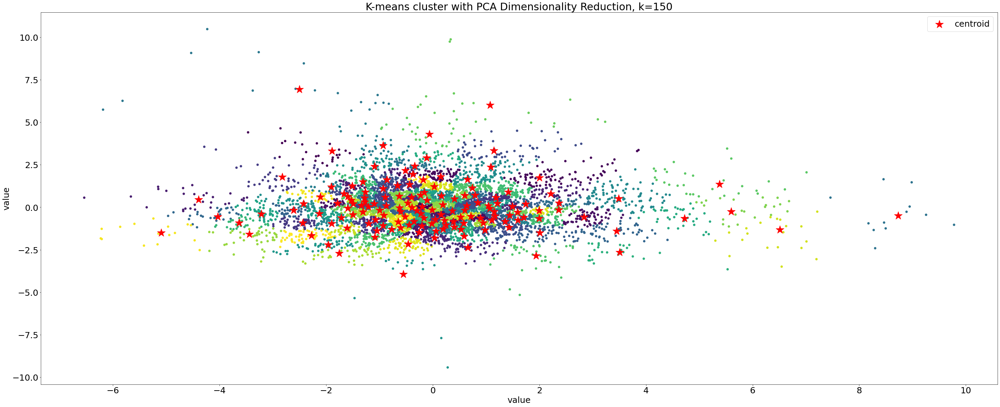

In [74]:
centroids, y_pred = _k_means_(reduced_components.values, 150, 100)
plt.figure()
plt.scatter(reduced_components[0], reduced_components[1], c=y_pred)
plt.title('K-means cluster with PCA Dimensionality Reduction, k=' + str(150), fontsize=30)
plt.xlabel('value', fontsize=25)
plt.ylabel('value', fontsize=25)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=600, c='red', label='centroid')
plt.rcParams["figure.figsize"] = (50,20)
plt.legend(fontsize=25)
plt.show()

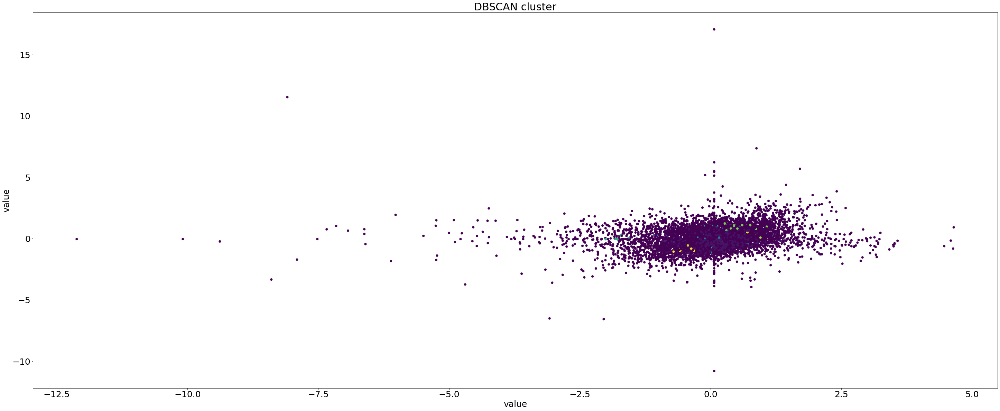

In [21]:
dbs = DBSCAN().fit(dataset)
y_pred = dbs.fit_predict(dataset)
plt.rcParams["figure.figsize"] = (50,20)
plt.title('DBSCAN cluster', fontsize=30)
plt.xlabel('value', fontsize=25)
plt.ylabel('value', fontsize=25)
plt.tick_params(axis='both', which='major', labelsize=25)

plt.scatter(dataset[:,1], dataset[:,2], c=y_pred)